<a href="https://colab.research.google.com/github/clobos/Andres_ESALQ/blob/main/dados_servidor_tecnico_administrativo.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [128]:
dados_servidor_tecnico_administrativo = pd.read_csv('servidor_tecnico_administrativo.csv')

dados_servidor_tecnico_administrativo.head()

,Idade,Vínculo,Sexo,Ano_ingresso,Curso_grad,Programa_pós,Nível,Departamento,Setor,Origem_vist,...,C_int,C_infacd,C_orgtrans,C_qveic,C_visit,C_funcio,C_santi,C_mobl,C_aPSaude,Interesse_ativ
0,De 26 a 35 anos,Servidor Técnico-Administrativo,Prefiro não responder,NaN,0,0,0,0,ESALQ/SVAPESQ,0,...,Bom,Bom,Bom,Não sei opinar,Não sei opinar,Não sei opinar,Ruim,Ótimo,Não sei opinar,Bastante
1,De 56 a 65 anos,Servidor Técnico-Administrativo,Feminino,NaN,0,0,0,0,PUSP-LQ/DVMANOPER,0,...,Bom,Não sei opinar,Regular,Péssimo,Regular,Ótimo,Péssimo,Regular,Péssimo,Bastante
2,De 36 a 45 anos,Servidor Técnico-Administrativo,Masculino,NaN,0,0,0,0,ESALQ/SCGECCP,0,...,Bom,Não sei opinar,Bom,Ruim,Não sei opinar,Bom,Ruim,Bom,Bom,Bastante
3,De 36 a 45 anos,Servidor Técnico-Administrativo,Feminino,NaN,0,0,0,0,ESALQ/SVAPESQ,0,...,Regular,Regular,Regular,Regular,Bom,Regular,Regular,Regular,Bom,Bastante
4,De 46 a 55 anos,Servidor Técnico-Administrativo,0,NaN,0,0,0,0,ESALQ,0,...,Bom,Bom,Bom,Bom,Bom,Bom,Bom,Bom,Regular,Não sei responder


In [129]:
dados_servidor_tecnico_administrativo.shape

(153, 57)

In [130]:
print(dados_servidor_tecnico_administrativo.columns)

Index(['Idade', 'Vínculo', 'Sexo', 'Ano_ingresso', 'Curso_grad',
       'Programa_pós', 'Nível', 'Departamento', 'Setor', 'Origem_vist',
       'Frequencia', 'Campus_agradavel', 'Impacto', 'Participação',
       'Particip_fora', 'Interesse', 'Conhecimento', 'Compromisso',
       'Transformador', 'Segurança', 'Alt_seg_noite', 'Distância',
       'Modal_atecampus', 'S_Ilum', 'S_ag', 'S_equ', 'S_vias', 'S_cal',
       'S_acess', 'S_sinal', 'S_ciclovias', 'Aplicativo', 'C_Acol', 'C_pert',
       'C_Sau', 'C_atendaluno', 'C_PAPFE', 'C_moradia', 'C_cre', 'C_gen',
       'C_etn', 'C_aces', 'C_Rucas', 'C_alim', 'C_conv', 'C_esp', 'C_estudo',
       'C_int', 'C_infacd', 'C_orgtrans', 'C_qveic', 'C_visit', 'C_funcio',
       'C_santi', 'C_mobl', 'C_aPSaude', 'Interesse_ativ'],
      dtype='object')


In [131]:
def clean_idade(idade_str):
    """Removes 'De', 'a', and 'anos' from the idade string and returns a list of numbers."""
    if pd.isna(idade_str):
        return None
    cleaned = idade_str.replace('De ', '').replace(' a ', '-').replace(' anos', '').replace(' ', '')
    if '-' in cleaned:
        return [int(i) for i in cleaned.split('-')]
    elif cleaned.isdigit():
        return [int(cleaned)]
    else:
        return cleaned # Return as is if it doesn't fit the expected pattern

dados_servidor_tecnico_administrativo['idade_limpa'] = dados_servidor_tecnico_administrativo['Idade'].apply(clean_idade)

# Drop the original 'Idade' column
dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo.drop(columns=['Idade'])


dados_servidor_tecnico_administrativo['idade_limpa'].value_counts()



,count
idade_limpa,
"[56, 65]",52
"[46, 55]",48
"[36, 45]",40
"[26, 35]",9
Maisde66,3
[0],1


In [132]:
dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo[dados_servidor_tecnico_administrativo['idade_limpa'] != 'Maisde66']


In [133]:
idade_limpa_counts = dados_servidor_tecnico_administrativo['idade_limpa'].value_counts()


departamentos_to_keep = idade_limpa_counts[idade_limpa_counts >= 5].index
departamentos_to_keep

dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo[dados_servidor_tecnico_administrativo['idade_limpa'].isin(departamentos_to_keep)]

dados_servidor_tecnico_administrativo['idade_limpa'].value_counts()



,count
idade_limpa,
"[56, 65]",52
"[46, 55]",48
"[36, 45]",40
"[26, 35]",9


In [134]:
dados_servidor_tecnico_administrativo.shape

(149, 57)

In [135]:
# Calculate the percentage of missing values for each column
missing_values = dados_servidor_tecnico_administrativo.isnull().sum() / len(dados_servidor_tecnico_administrativo) * 100

# Display columns with missing values and their percentage
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)

print("Percentage of missing values per column:")
display(missing_values)

Percentage of missing values per column:


,0
Ano_ingresso,100.000000
C_atendaluno,100.000000
Alt_seg_noite,4.026846
C_Acol,2.684564
C_santi,2.013423
Interesse_ativ,2.013423
C_infacd,2.013423
C_aces,2.013423
C_cre,2.013423
C_alim,2.013423


In [136]:
colunas_para_frequencia = [
    "Curso_grad",
    "Programa_pós",
    "Nível",
    "Departamento",
    "Origem_vist",
    "Ano_ingresso",
    "C_atendaluno"
]

# Filter for columns that still exist in the dataframe
existing_columns = [col for col in colunas_para_frequencia if col in dados_servidor_tecnico_administrativo.columns]

if existing_columns:
    print("Frequency Tables for requested columns:")
    for col in existing_columns:
        print(f"\nFrequency for {col}:")
        display(dados_servidor_tecnico_administrativo[col].value_counts(dropna=False)) # Include NaN counts
else:
    print("None of the requested columns exist in the DataFrame.")

Frequency Tables for requested columns:

Frequency for Curso_grad:


,count
Curso_grad,
0,149



Frequency for Programa_pós:


,count
Programa_pós,
0,149



Frequency for Nível:


,count
Nível,
0,149



Frequency for Departamento:


,count
Departamento,
0,149



Frequency for Origem_vist:


,count
Origem_vist,
0,149



Frequency for Ano_ingresso:


,count
Ano_ingresso,
NaN,149



Frequency for C_atendaluno:


,count
C_atendaluno,
NaN,149


In [137]:
colunas_para_excluir_servidor_tecnico_administrativo = [
    "Curso_grad",
    "Programa_pós",
    "Nível",
    "Departamento",
    "Origem_vist",
    "Ano_ingresso",
"C_atendaluno"
]

dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo.drop(columns=colunas_para_excluir_servidor_tecnico_administrativo, errors='ignore')


dados_servidor_tecnico_administrativo.head()

,Vínculo,Sexo,Setor,Frequencia,Campus_agradavel,Impacto,Participação,Particip_fora,Interesse,Conhecimento,...,C_infacd,C_orgtrans,C_qveic,C_visit,C_funcio,C_santi,C_mobl,C_aPSaude,Interesse_ativ,idade_limpa
0,Servidor Técnico-Administrativo,Prefiro não responder,ESALQ/SVAPESQ,Apenas em dias úteis (de segunda a sexta),Sim,Não,"Conheço, mas não participei","Sim, em outros lugares",Extremamente,Moderadamente,...,Bom,Bom,Não sei opinar,Não sei opinar,Não sei opinar,Ruim,Ótimo,Não sei opinar,Bastante,"[26, 35]"
1,Servidor Técnico-Administrativo,Feminino,PUSP-LQ/DVMANOPER,Diariamente (de segunda a domingo),Sim,Não,Conheço e já participei,"Sim, no meu bairro/comunidade",Muito,Muito,...,Não sei opinar,Regular,Péssimo,Regular,Ótimo,Péssimo,Regular,Péssimo,Bastante,"[56, 65]"
2,Servidor Técnico-Administrativo,Masculino,ESALQ/SCGECCP,Apenas em dias úteis (de segunda a sexta),Sim,Em partes,"Conheço, mas não participei",Não,Extremamente,Extremamente,...,Não sei opinar,Bom,Ruim,Não sei opinar,Bom,Ruim,Bom,Bom,Bastante,"[36, 45]"
3,Servidor Técnico-Administrativo,Feminino,ESALQ/SVAPESQ,Apenas em dias úteis (de segunda a sexta),Sim,Não,"Conheço, mas não participei","Sim, em outros lugares",Extremamente,Muito,...,Regular,Regular,Regular,Bom,Regular,Regular,Regular,Bom,Bastante,"[36, 45]"
4,Servidor Técnico-Administrativo,0,ESALQ,Diariamente (de segunda a domingo),Sim,Não,Conheço e já participei,NaN,Moderadamente,Moderadamente,...,Bom,Bom,Bom,Bom,Bom,Bom,Bom,Regular,Não sei responder,"[46, 55]"


In [138]:
# Calculate the percentage of missing values for each column
missing_values = dados_servidor_tecnico_administrativo.isnull().sum() / len(dados_servidor_tecnico_administrativo) * 100

# Display columns with missing values and their percentage
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)

print("Percentage of missing values per column:")
display(missing_values)

Percentage of missing values per column:


,0
Alt_seg_noite,4.026846
C_Acol,2.684564
Interesse_ativ,2.013423
C_infacd,2.013423
C_conv,2.013423
C_aces,2.013423
C_santi,2.013423
C_alim,2.013423
C_cre,2.013423
Frequencia,1.342282


In [139]:
float_cols = dados_servidor_tecnico_administrativo.select_dtypes(include='float64')
print("Min and Max for Float64 columns:")
display(float_cols.agg(['min', 'max']))

Min and Max for Float64 columns:


,Distância
min,1.0
max,120.0


In [140]:
dados_servidor_tecnico_administrativo['Distância'].describe()

,Distância
count,149.000000
mean,11.087248
std,14.401545
min,1.000000
25%,5.000000
50%,7.000000
75%,10.000000
max,120.000000


In [141]:
dados_servidor_tecnico_administrativo

,Vínculo,Sexo,Setor,Frequencia,Campus_agradavel,Impacto,Participação,Particip_fora,Interesse,Conhecimento,...,C_infacd,C_orgtrans,C_qveic,C_visit,C_funcio,C_santi,C_mobl,C_aPSaude,Interesse_ativ,idade_limpa
0,Servidor Técnico-Administrativo,Prefiro não responder,ESALQ/SVAPESQ,Apenas em dias úteis (de segunda a sexta),Sim,Não,"Conheço, mas não participei","Sim, em outros lugares",Extremamente,Moderadamente,...,Bom,Bom,Não sei opinar,Não sei opinar,Não sei opinar,Ruim,Ótimo,Não sei opinar,Bastante,"[26, 35]"
1,Servidor Técnico-Administrativo,Feminino,PUSP-LQ/DVMANOPER,Diariamente (de segunda a domingo),Sim,Não,Conheço e já participei,"Sim, no meu bairro/comunidade",Muito,Muito,...,Não sei opinar,Regular,Péssimo,Regular,Ótimo,Péssimo,Regular,Péssimo,Bastante,"[56, 65]"
2,Servidor Técnico-Administrativo,Masculino,ESALQ/SCGECCP,Apenas em dias úteis (de segunda a sexta),Sim,Em partes,"Conheço, mas não participei",Não,Extremamente,Extremamente,...,Não sei opinar,Bom,Ruim,Não sei opinar,Bom,Ruim,Bom,Bom,Bastante,"[36, 45]"
3,Servidor Técnico-Administrativo,Feminino,ESALQ/SVAPESQ,Apenas em dias úteis (de segunda a sexta),Sim,Não,"Conheço, mas não participei","Sim, em outros lugares",Extremamente,Muito,...,Regular,Regular,Regular,Bom,Regular,Regular,Regular,Bom,Bastante,"[36, 45]"
4,Servidor Técnico-Administrativo,0,ESALQ,Diariamente (de segunda a domingo),Sim,Não,Conheço e já participei,NaN,Moderadamente,Moderadamente,...,Bom,Bom,Bom,Bom,Bom,Bom,Bom,Regular,Não sei responder,"[46, 55]"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
148,Servidor Técnico-Administrativo,Feminino,CENA/Lab.,Apenas em dias úteis (de segunda a sexta),Sim,Não,Conheço e já participei,"Sim, em outros lugares",Muito,Muito,...,Bom,Regular,Bom,Bom,Bom,Regular,Bom,Bom,NaN,"[46, 55]"
149,Servidor Técnico-Administrativo,Feminino,CENA/DVPROD,Apenas em dias úteis (de segunda a sexta),Sim,Não,Conheço e já participei,"Sim, em outros lugares",Muito,Muito,...,Regular,Ruim,Bom,Regular,Bom,Regular,Regular,Bom,Pouco,"[46, 55]"
150,Servidor Técnico-Administrativo,Feminino,ESALQ/Lab.,Apenas em dias úteis (de segunda a sexta),Sim,Em partes,Conheço e já participei,Não,Muito,Muito,...,Bom,Bom,Bom,Bom,Bom,Regular,Regular,Regular,Pouco,"[46, 55]"
151,Servidor Técnico-Administrativo,Feminino,PUSP-LQ,Diariamente (de segunda a domingo),Sim,Não,"Conheço, mas não participei",Não,Muito,Muito,...,Não sei opinar,Bom,Regular,Regular,Ótimo,Ruim,Não sei opinar,Bom,Bastante,"[36, 45]"


In [142]:
# Calculate the percentage of missing values for each column
missing_values = dados_servidor_tecnico_administrativo.isnull().sum() / len(dados_servidor_tecnico_administrativo) * 100

# Display columns with missing values and their percentage
missing_values = missing_values[missing_values > 0].sort_values(ascending=False)

print("Percentage of missing values per column:")
display(missing_values)

Percentage of missing values per column:


,0
Alt_seg_noite,4.026846
C_Acol,2.684564
Interesse_ativ,2.013423
C_infacd,2.013423
C_conv,2.013423
C_aces,2.013423
C_santi,2.013423
C_alim,2.013423
C_cre,2.013423
Frequencia,1.342282


In [143]:
dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo[dados_servidor_tecnico_administrativo['C_funcio'] != '0']
dados_servidor_tecnico_administrativo['C_funcio'].value_counts()

,count
C_funcio,
Bom,70
Regular,31
Ótimo,24
Ruim,10
Não sei opinar,6
Péssimo,6


In [144]:
# Select object columns and generate frequency tables
object_cols = dados_servidor_tecnico_administrativo.select_dtypes(include='object')
print("\nFrequency Tables for Object columns:")
for col in object_cols.columns:
    print(f"\nFrequency for {col}:")
    display(object_cols[col].value_counts())


Frequency Tables for Object columns:

Frequency for Vínculo:


,count
Vínculo,
Servidor Técnico-Administrativo,147



Frequency for Sexo:


,count
Sexo,
Feminino,80
Masculino,64
0,2
Prefiro não responder,1



Frequency for Setor:


,count
Setor,
ESALQ,21
ESALQ/LCF,5
ESALQ/Lab.,5
ESALQ/LGN,5
CENA/Lab.,4
...,...
ESALQ/SVGAMRQ,1
ESALQ/Cebtec,1
ESALQ/Obras,1



Frequency for Frequencia:


,count
Frequencia,
Apenas em dias úteis (de segunda a sexta),118
Diariamente (de segunda a domingo),27



Frequency for Campus_agradavel:


,count
Campus_agradavel,
Sim,146



Frequency for Impacto:


,count
Impacto,
Não,123
Em partes,21
Sim,3



Frequency for Participação:


,count
Participação,
Conheço e já participei,81
"Conheço, mas não participei",45
Não conheço,21



Frequency for Particip_fora:


,count
Particip_fora,
Não,78
"Sim, no meu bairro/comunidade",30
"Sim, em outros lugares",28
"Sim, na instituição religiosa",10



Frequency for Interesse:


,count
Interesse,
Muito,68
Moderadamente,47
Extremamente,19
Pouco,8
Muito Pouco,3
Não sei opinar,1



Frequency for Conhecimento:


,count
Conhecimento,
Moderadamente,76
Muito,44
Pouco,13
Extremamente,7
Muito Pouco,4
Não sei opinar,1



Frequency for Compromisso:


,count
Compromisso,
Muito,68
Moderadamente,48
Extremamente,15
Pouco,11
Muito Pouco,3



Frequency for Transformador:


,count
Transformador,
Moderadamente,55
Muito,39
Pouco,27
Muito Pouco,13
Extremamente,8
Não sei opinar,3



Frequency for Segurança:


,count
Segurança,
Seguro(a),67
Inseguro(a),43
Indiferente,16
Muito seguro(a),12
Muito inseguro(a),9



Frequency for Alt_seg_noite:


,count
Alt_seg_noite,
"Sim, me sinto menos seguro(a) no Campus no período noturno",70
"Não, continuo me sentindo seguro(a)",39
Não frequento o Campus no período noturno,32



Frequency for Modal_atecampus:


,count
Modal_atecampus,
Carro,120
Moto,16
Bicicleta,4
Ônibus,2
A pé,2
Carro e ônibus,1



Frequency for S_Ilum:


,count
S_Ilum,
Regular,53
Bom,50
Ruim,28
Péssimo,8
Não sei opinar,6
Ótimo,1



Frequency for S_ag:


,count
S_ag,
Regular,60
Bom,34
Ruim,31
Péssimo,10
Não sei opinar,8
Ótimo,3



Frequency for S_equ:


,count
S_equ,
Regular,52
Bom,33
Ruim,26
Não sei opinar,24
Péssimo,11



Frequency for S_vias:


,count
S_vias,
Regular,63
Bom,46
Ruim,22
Ótimo,9
Péssimo,6



Frequency for S_cal:


,count
S_cal,
Regular,50
Ruim,37
Bom,33
Péssimo,18
Ótimo,7



Frequency for S_acess:


,count
S_acess,
Regular,43
Ruim,41
Péssimo,22
Bom,20
Não sei opinar,17
Ótimo,3



Frequency for S_sinal:


,count
S_sinal,
Regular,41
Ruim,40
Bom,33
Péssimo,28
Ótimo,4
Não sei opinar,1



Frequency for Aplicativo:


,count
Aplicativo,
"Conheço, mas nunca utilizei",64
Conheço,53
Não conheço,30



Frequency for C_Acol:


,count
C_Acol,
Bom,43
Regular,43
Ótimo,34
Ruim,16
Não sei opinar,5
Péssimo,3



Frequency for C_pert:


,count
C_pert,
Bom,52
Regular,38
Ótimo,36
Ruim,13
Péssimo,5
Não sei opinar,3



Frequency for C_Sau:


,count
C_Sau,
Regular,37
Não sei opinar,35
Ruim,31
Bom,26
Péssimo,12
Ótimo,5



Frequency for C_cre:


,count
C_cre,
Não sei opinar,76
Bom,32
Regular,17
Ótimo,13
Ruim,5
Péssimo,2



Frequency for C_gen:


,count
C_gen,
Não sei opinar,52
Bom,34
Regular,29
Ruim,16
Péssimo,8
Ótimo,7



Frequency for C_etn:


,count
C_etn,
Não sei opinar,48
Bom,38
Regular,28
Ruim,17
Péssimo,9
Ótimo,6



Frequency for C_aces:


,count
C_aces,
Regular,45
Bom,41
Ruim,30
Não sei opinar,15
Péssimo,10
Ótimo,4



Frequency for C_alim:


,count
C_alim,
Regular,40
Bom,31
Ruim,30
Péssimo,24
Não sei opinar,12
Ótimo,8



Frequency for C_conv:


,count
C_conv,
Bom,37
Regular,35
Ruim,27
Péssimo,18
Não sei opinar,16
Ótimo,12



Frequency for C_esp:


,count
C_esp,
Bom,46
Não sei opinar,38
Regular,37
Ótimo,16
Ruim,7
Péssimo,3



Frequency for C_int:


,count
C_int,
Bom,66
Ótimo,48
Regular,24
Péssimo,4
Ruim,4
Não sei opinar,1



Frequency for C_infacd:


,count
C_infacd,
Bom,53
Ótimo,37
Não sei opinar,33
Regular,18
Péssimo,2
Ruim,2



Frequency for C_orgtrans:


,count
C_orgtrans,
Bom,57
Regular,40
Ruim,25
Ótimo,11
Péssimo,11
Não sei opinar,2



Frequency for C_qveic:


,count
C_qveic,
Regular,47
Bom,46
Ruim,25
Não sei opinar,12
Ótimo,10
Péssimo,7



Frequency for C_visit:


,count
C_visit,
Bom,51
Regular,34
Não sei opinar,28
Ruim,18
Ótimo,9
Péssimo,7



Frequency for C_funcio:


,count
C_funcio,
Bom,70
Regular,31
Ótimo,24
Ruim,10
Não sei opinar,6
Péssimo,6



Frequency for C_santi:


,count
C_santi,
Ruim,52
Péssimo,37
Regular,26
Bom,16
Não sei opinar,12
Ótimo,2



Frequency for C_mobl:


,count
C_mobl,
Regular,47
Bom,37
Ruim,32
Péssimo,13
Ótimo,10
Não sei opinar,7



Frequency for C_aPSaude:


,count
C_aPSaude,
Regular,49
Bom,44
Ruim,21
Ótimo,17
Péssimo,9
Não sei opinar,7



Frequency for Interesse_ativ:


,count
Interesse_ativ,
Pouco,62
Bastante,59
Nenhum,15
Não sei responder,8



Frequency for idade_limpa:


,count
idade_limpa,
"[56, 65]",51
"[46, 55]",47
"[36, 45]",40
"[26, 35]",9


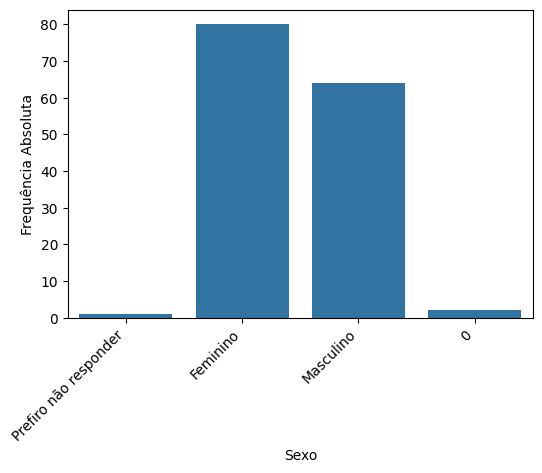

In [145]:
plt.figure(figsize=(6, 4))
sns.countplot(data=dados_servidor_tecnico_administrativo, x = dados_servidor_tecnico_administrativo['Sexo'])
plt.ylabel('Frequência Absoluta')
plt.xlabel('Sexo')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.show()

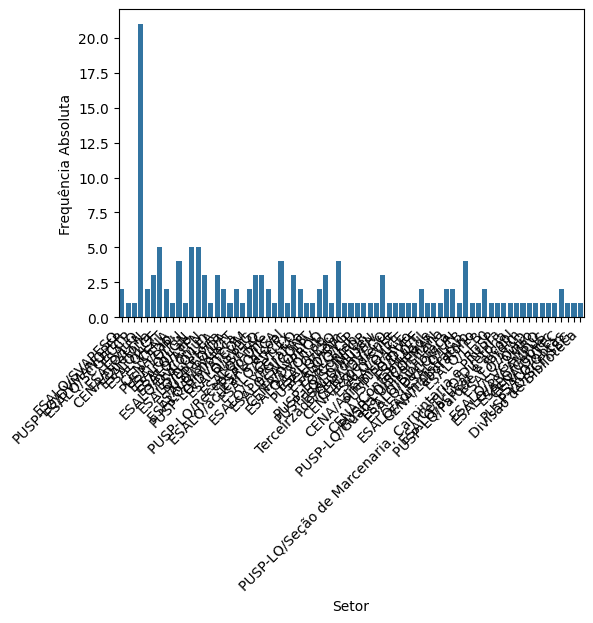

In [146]:
plt.figure(figsize=(6, 4))
sns.countplot(data=dados_servidor_tecnico_administrativo, x = dados_servidor_tecnico_administrativo['Setor'])
plt.ylabel('Frequência Absoluta')
plt.xlabel('Setor')
plt.xticks(rotation=45, ha='right') # Rotate labels for better readability
plt.show()

In [147]:
print(dados_servidor_tecnico_administrativo.columns)

Index(['Vínculo', 'Sexo', 'Setor', 'Frequencia', 'Campus_agradavel', 'Impacto',
       'Participação', 'Particip_fora', 'Interesse', 'Conhecimento',
       'Compromisso', 'Transformador', 'Segurança', 'Alt_seg_noite',
       'Distância', 'Modal_atecampus', 'S_Ilum', 'S_ag', 'S_equ', 'S_vias',
       'S_cal', 'S_acess', 'S_sinal', 'S_ciclovias', 'Aplicativo', 'C_Acol',
       'C_pert', 'C_Sau', 'C_PAPFE', 'C_moradia', 'C_cre', 'C_gen', 'C_etn',
       'C_aces', 'C_Rucas', 'C_alim', 'C_conv', 'C_esp', 'C_estudo', 'C_int',
       'C_infacd', 'C_orgtrans', 'C_qveic', 'C_visit', 'C_funcio', 'C_santi',
       'C_mobl', 'C_aPSaude', 'Interesse_ativ', 'idade_limpa'],
      dtype='object')


In [148]:
dados_servidor_tecnico_administrativo['Setor'].value_counts()

,count
Setor,
ESALQ,21
ESALQ/LCF,5
ESALQ/Lab.,5
ESALQ/LGN,5
CENA/Lab.,4
...,...
ESALQ/SVGAMRQ,1
ESALQ/Cebtec,1
ESALQ/Obras,1


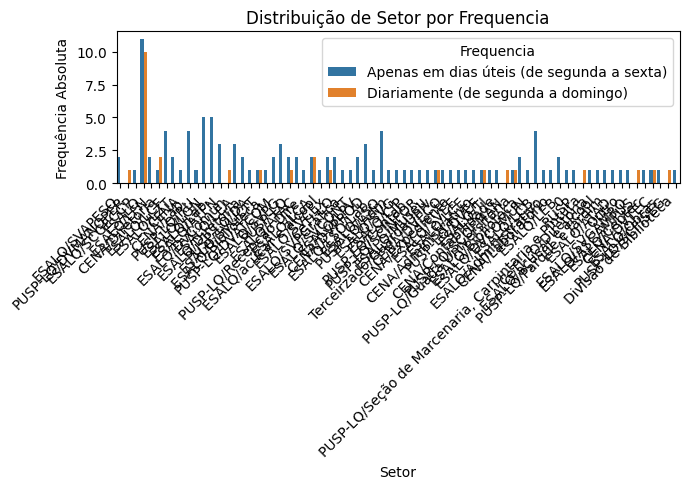

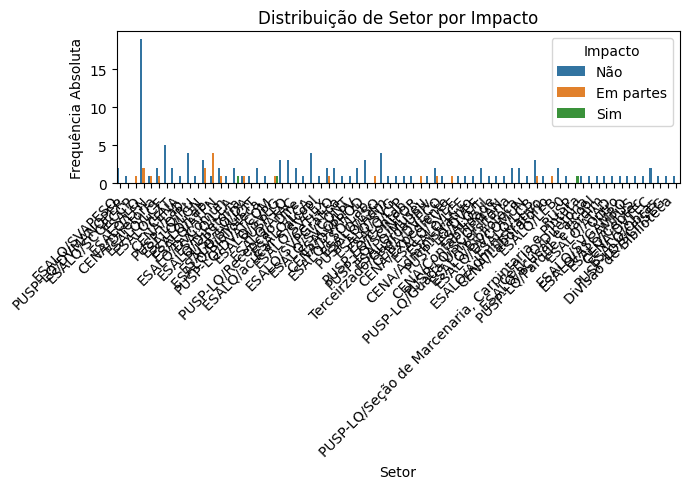

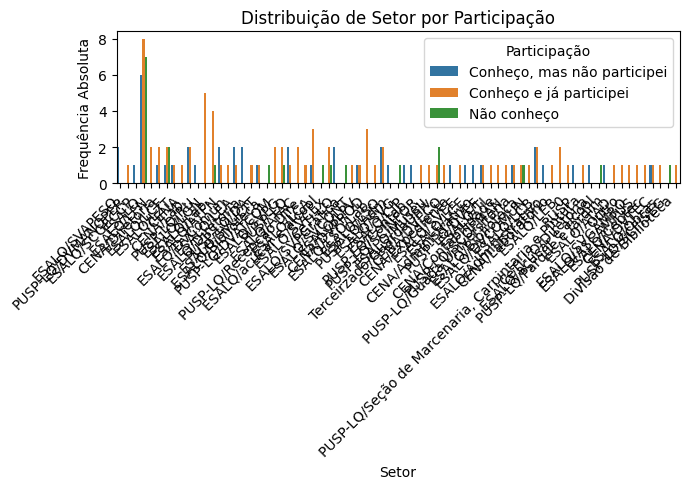

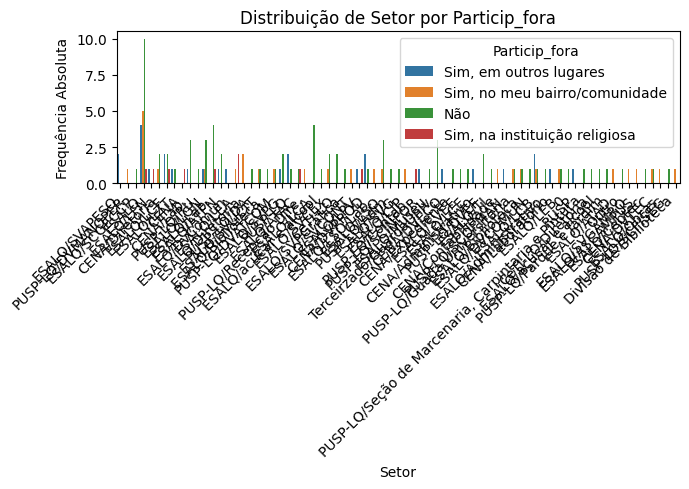

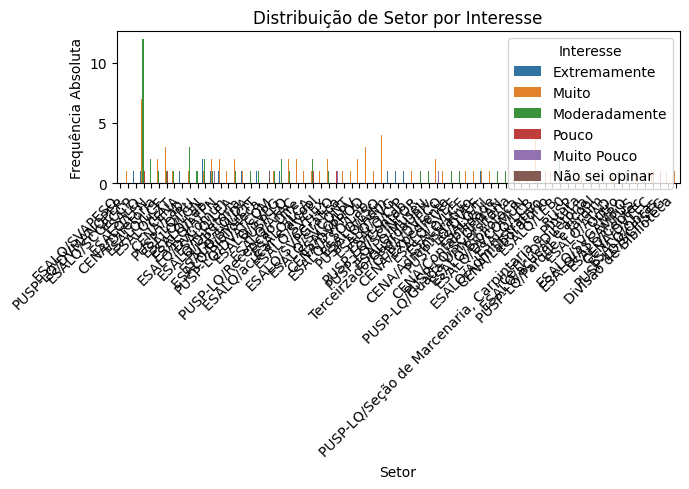

...

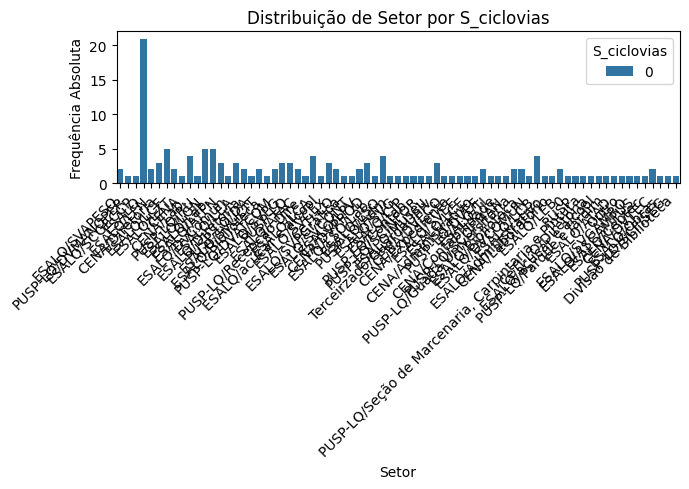

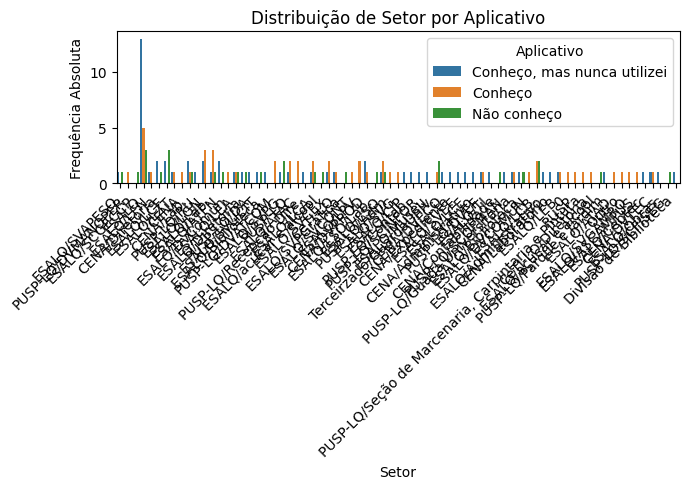

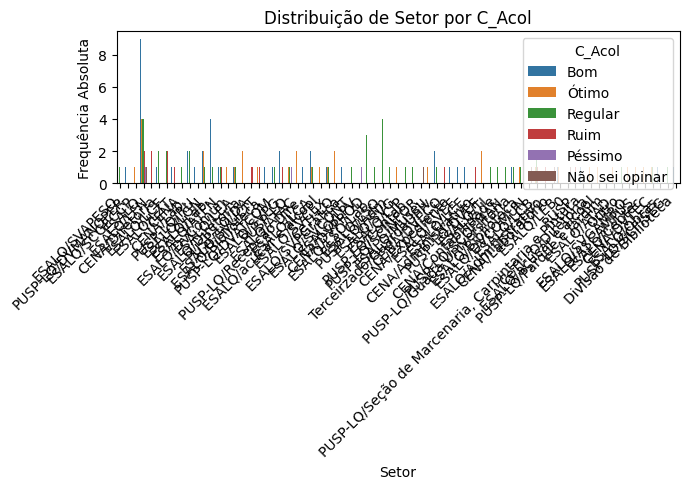

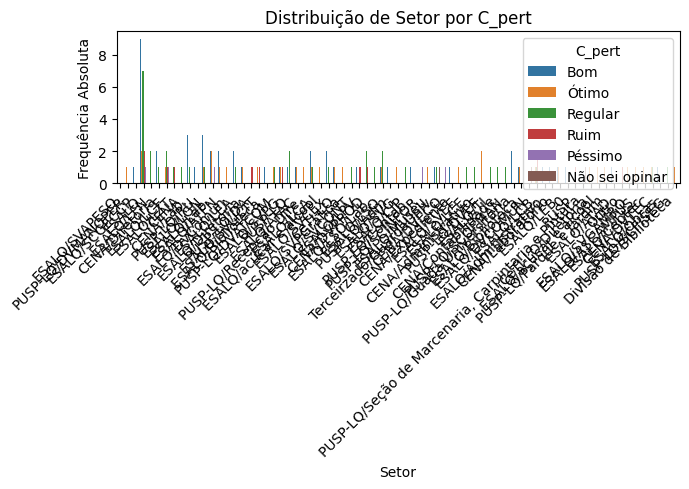

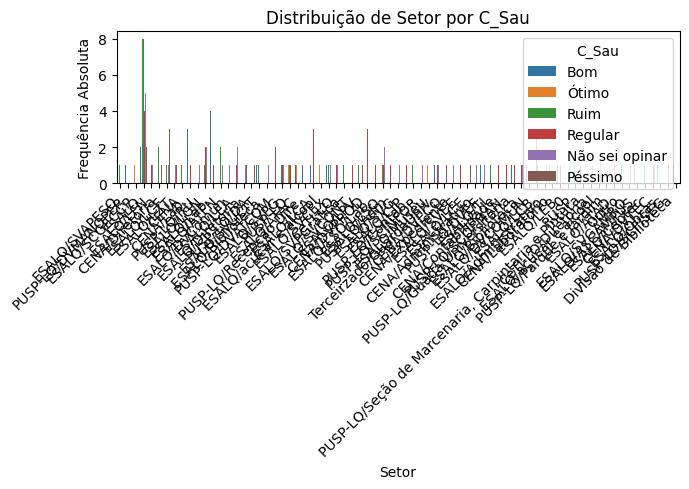

One or both columns ('Setor', 'C_atendaluno') not found in the DataFrame.


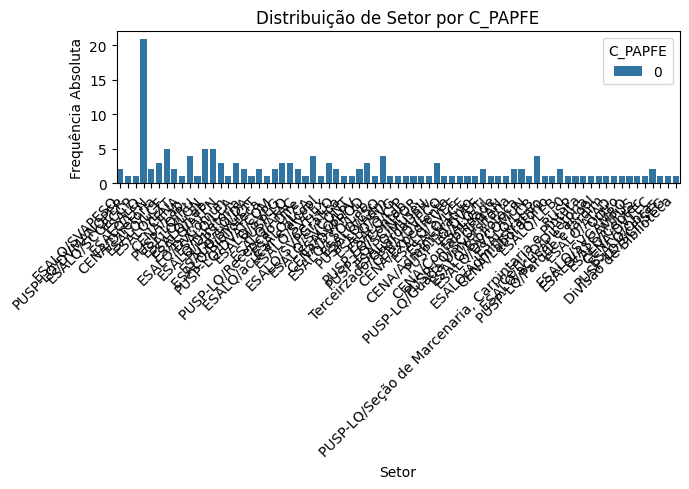

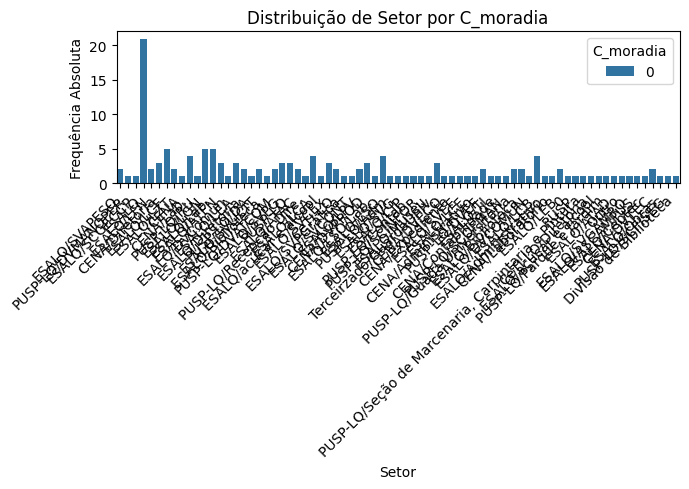

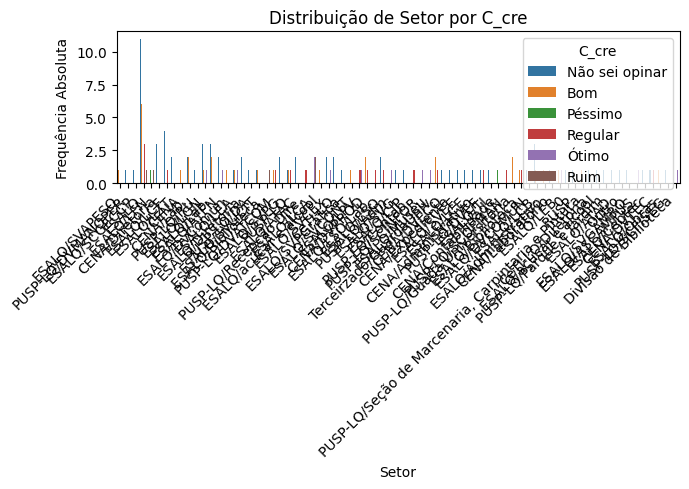

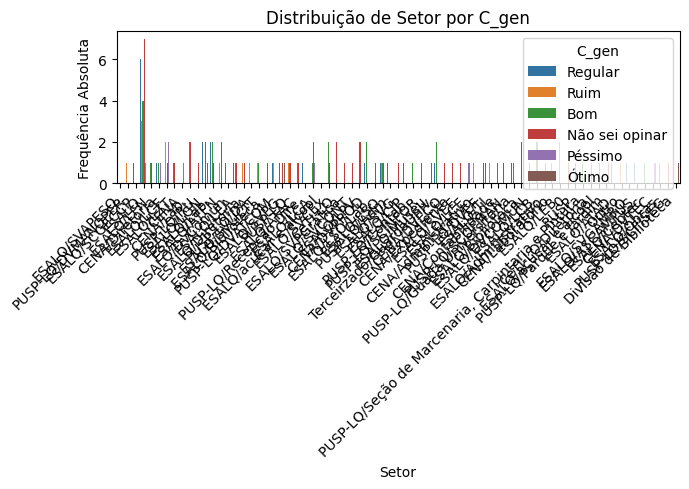

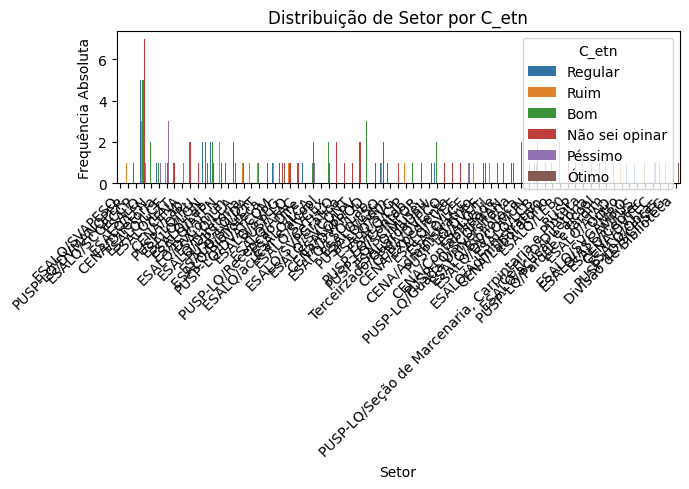

...

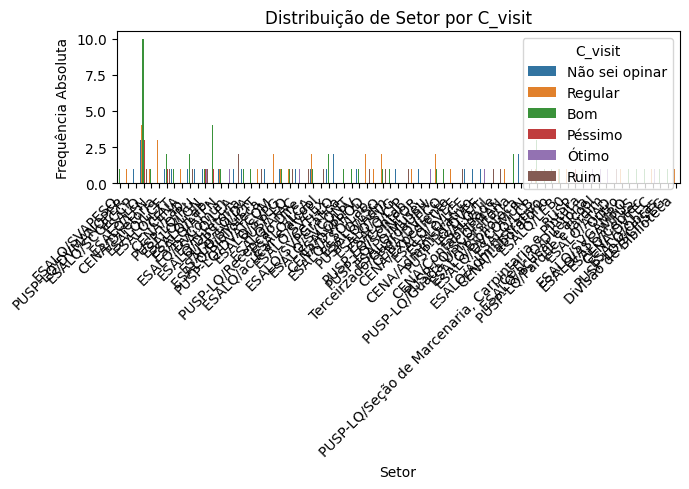

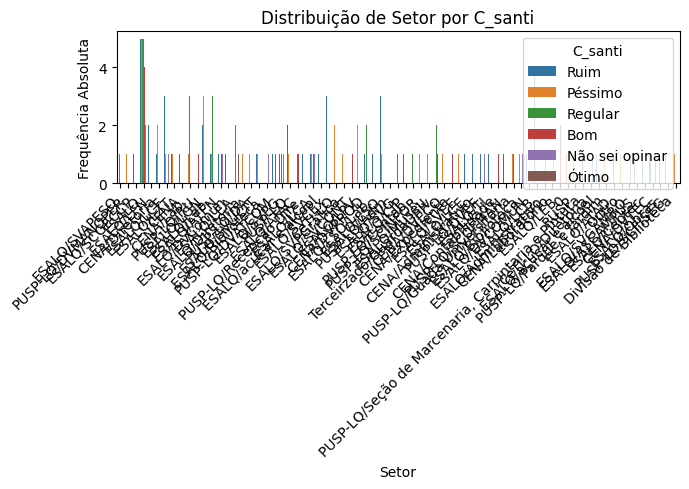

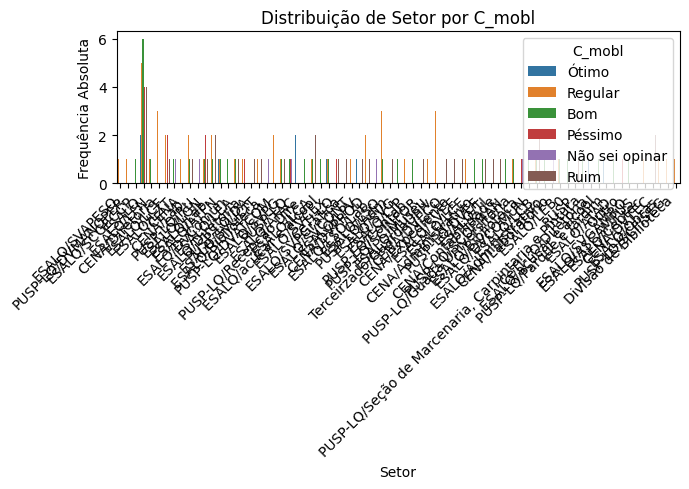

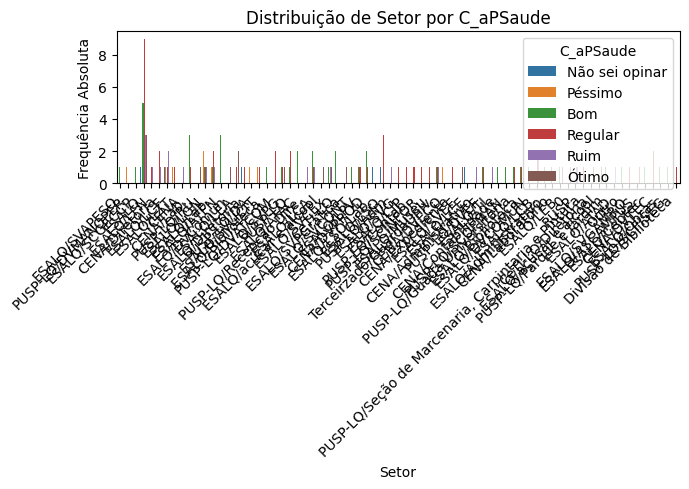

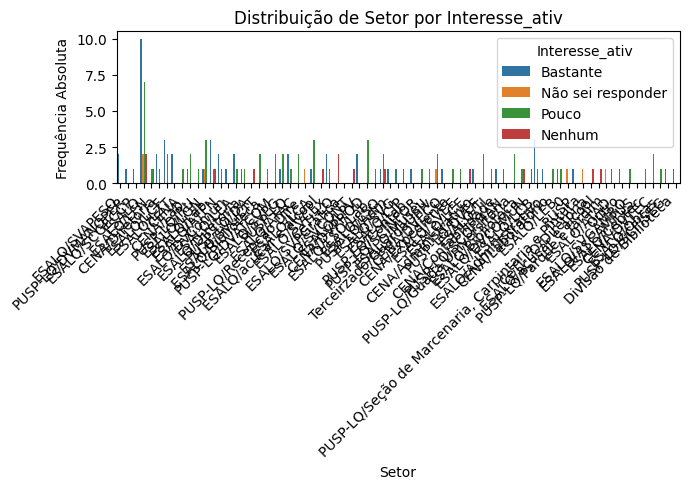

In [149]:
variables_to_plot = [
    'Frequencia', 'Impacto', 'Participação', 'Particip_fora',
    'Interesse', 'Conhecimento', 'Compromisso', 'Transformador', 'Segurança',
    'Alt_seg_noite', 'Modal_atecampus', 'S_Ilum', 'S_ag', 'S_equ', 'S_vias',
    'S_cal', 'S_acess', 'S_sinal', 'S_ciclovias', 'Aplicativo', 'C_Acol',
    'C_pert', 'C_Sau', 'C_atendaluno', 'C_PAPFE', 'C_moradia', 'C_cre', 'C_gen',
    'C_etn', 'C_aces', 'C_Rucas', 'C_alim', 'C_conv', 'C_esp', 'C_estudo',
    'C_int', 'C_infacd', 'C_orgtrans', 'C_qveic', 'C_visit', 'C_santi', 'C_mobl',
    'C_aPSaude', 'Interesse_ativ'
]

for col in variables_to_plot:
    if col in dados_servidor_tecnico_administrativo.columns and 'Setor' in dados_servidor_tecnico_administrativo.columns:
        plt.figure(figsize=(7, 5))
        sns.countplot(data=dados_servidor_tecnico_administrativo, x='Setor', hue=col)
        plt.title(f'Distribuição de Setor por {col}')
        plt.xlabel('Setor')
        plt.ylabel('Frequência Absoluta')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=col)
        plt.tight_layout()
        plt.show()
    else:
        print(f"One or both columns ('Setor', '{col}') not found in the DataFrame.")



In [150]:
setor_counts = dados_servidor_tecnico_administrativo['Setor'].value_counts()

setor_to_keep = setor_counts[setor_counts >= 3].index

dados_servidor_tecnico_administrativo = dados_servidor_tecnico_administrativo[dados_servidor_tecnico_administrativo['Setor'].isin(setor_to_keep)]

dados_servidor_tecnico_administrativo['Setor'].value_counts()

,count
Setor,
ESALQ,21
ESALQ/LCF,5
ESALQ/Lab.,5
ESALQ/LGN,5
CENA/Lab.,4
ESALQ/LCB,4
ESALQ/LSO,4
ESALQ/LCA,4
ESALQ/LEA,3


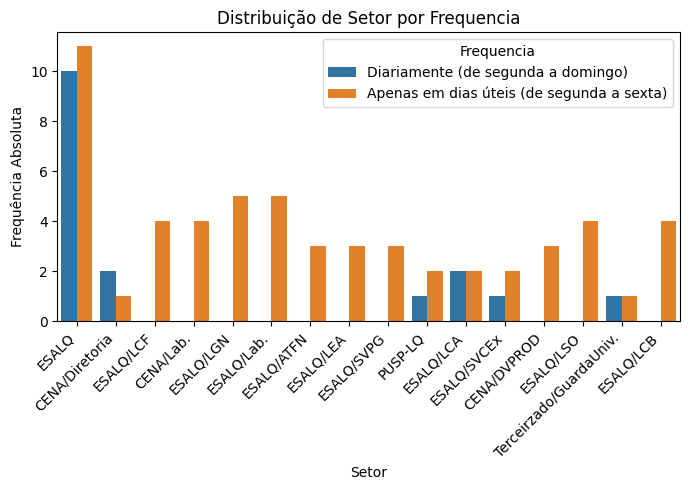

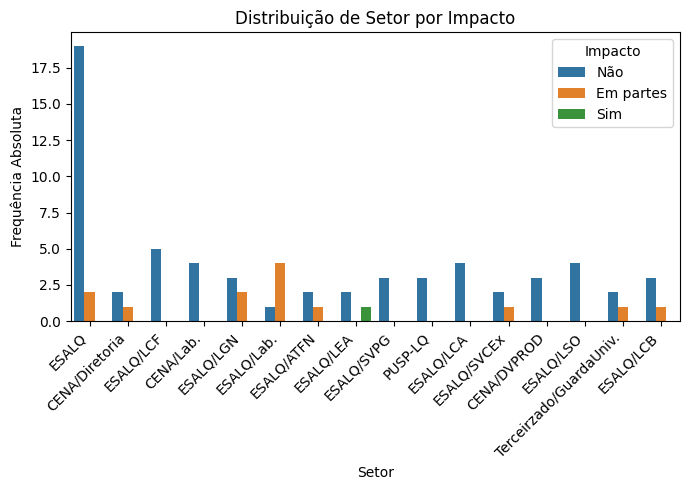

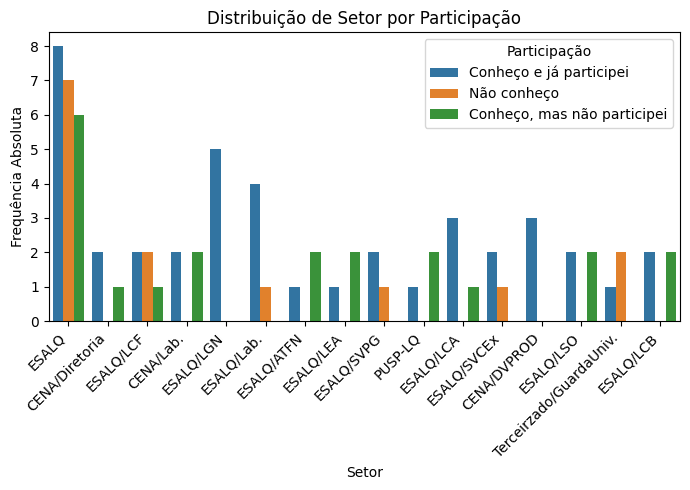

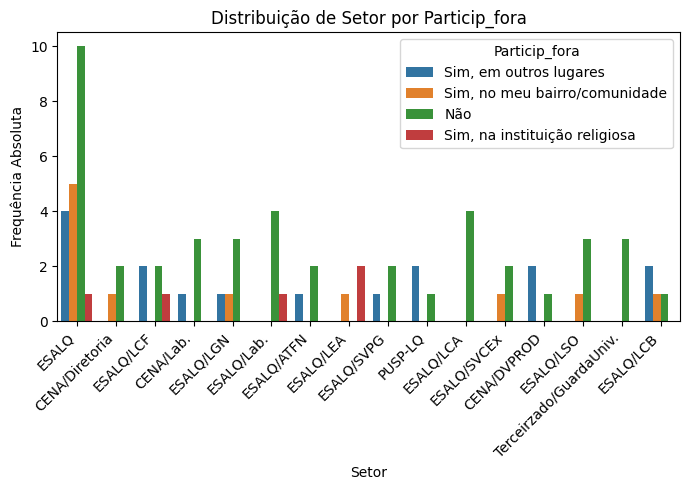

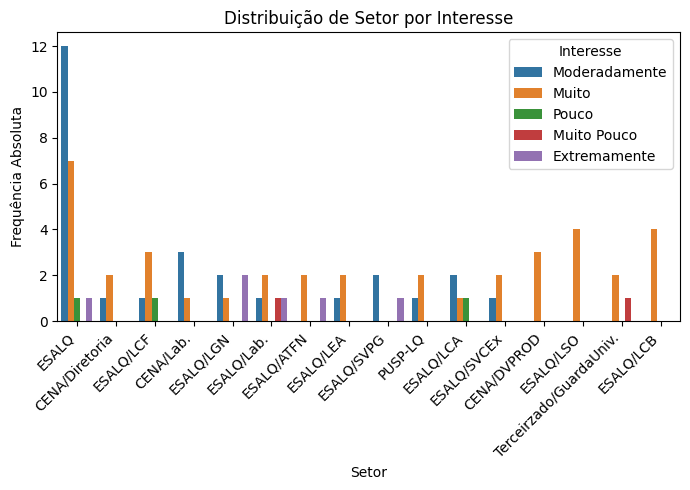

...

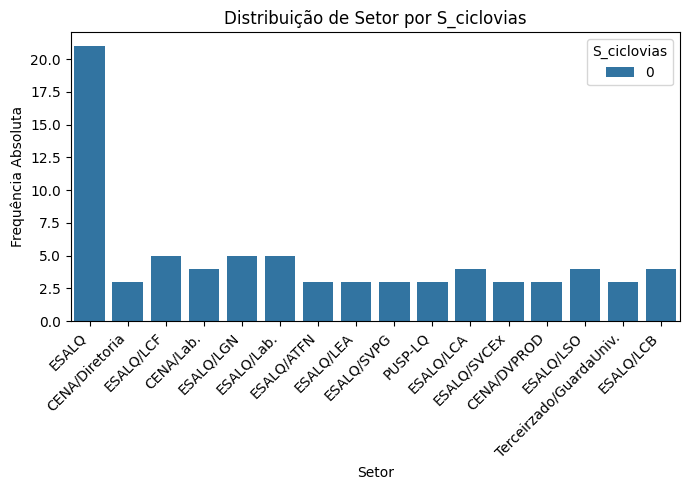

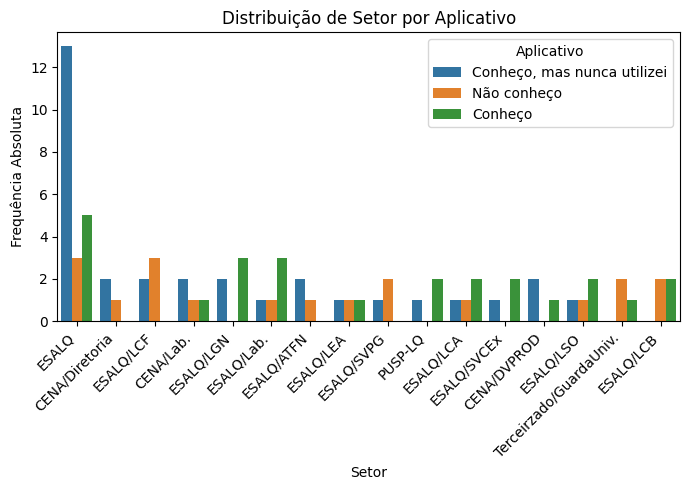

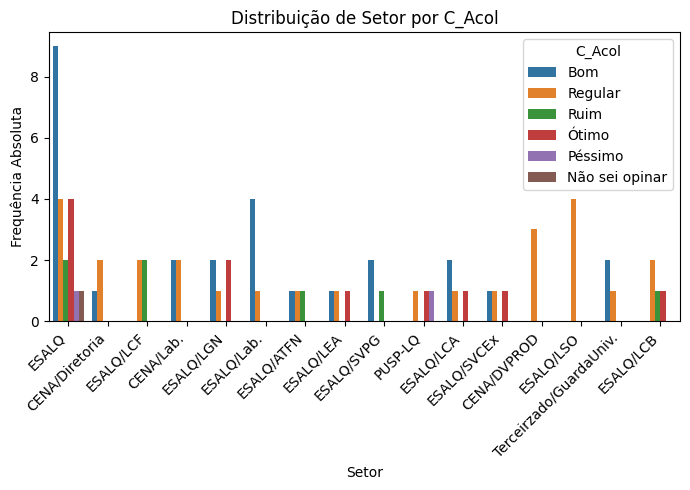

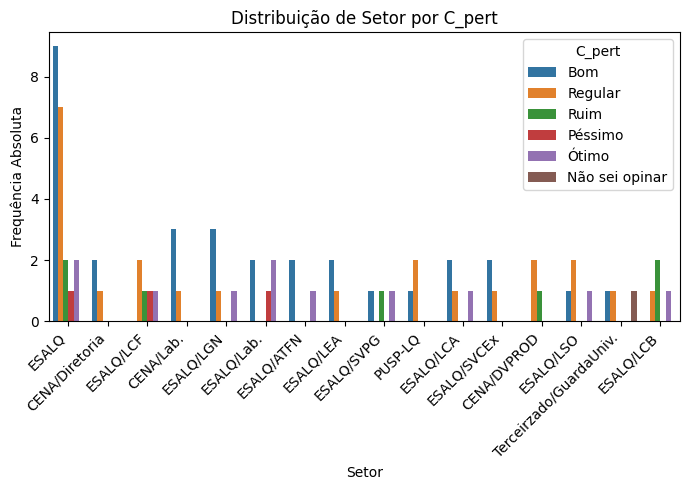

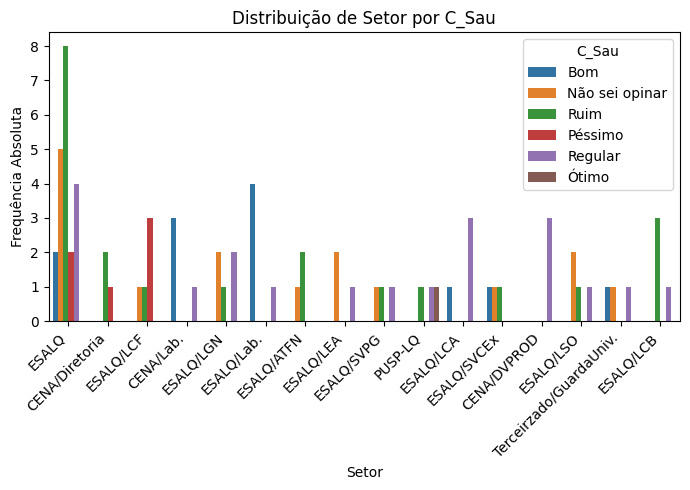

One or both columns ('Setor', 'C_atendaluno') not found in the DataFrame.


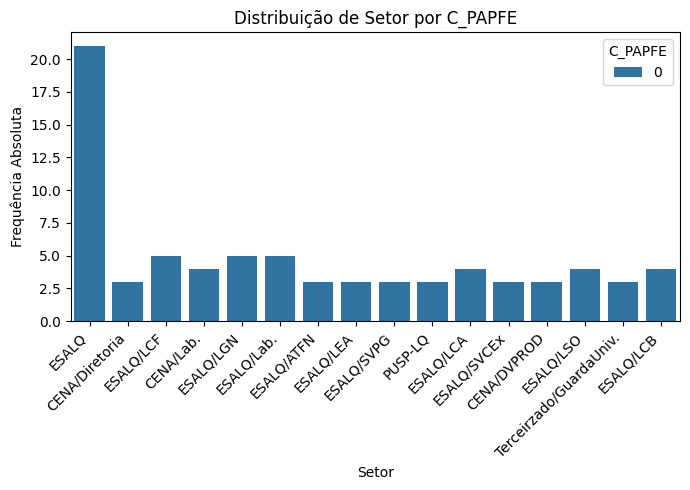

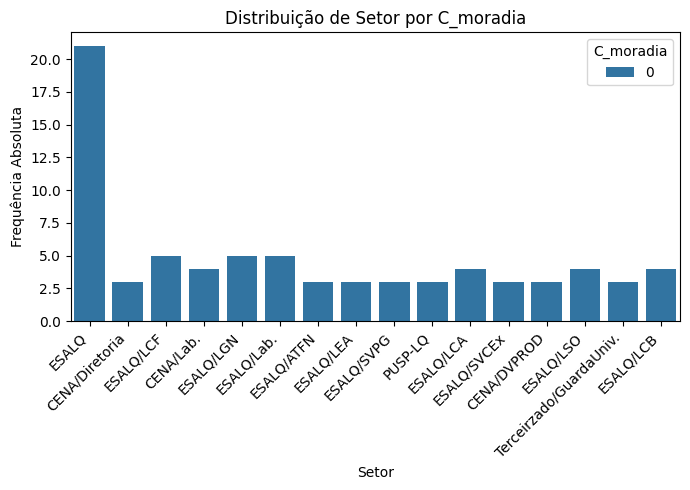

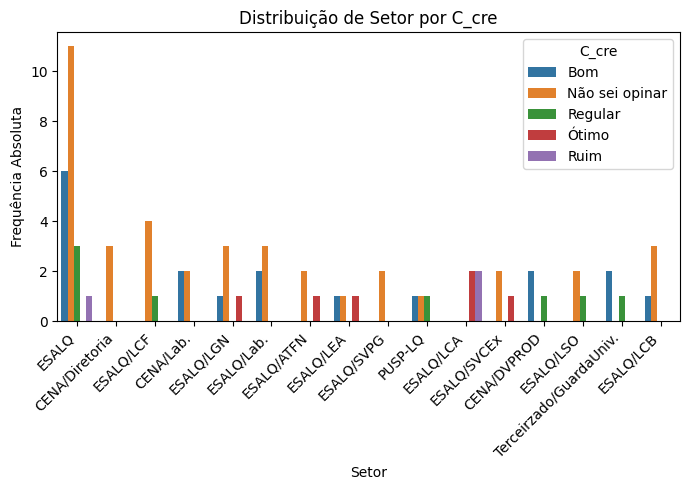

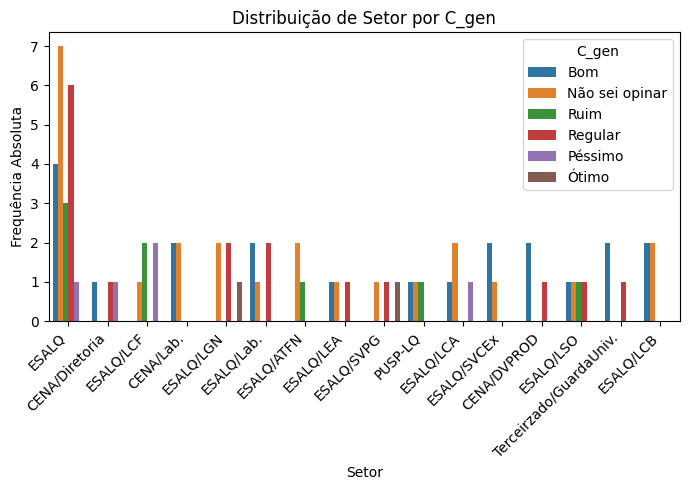

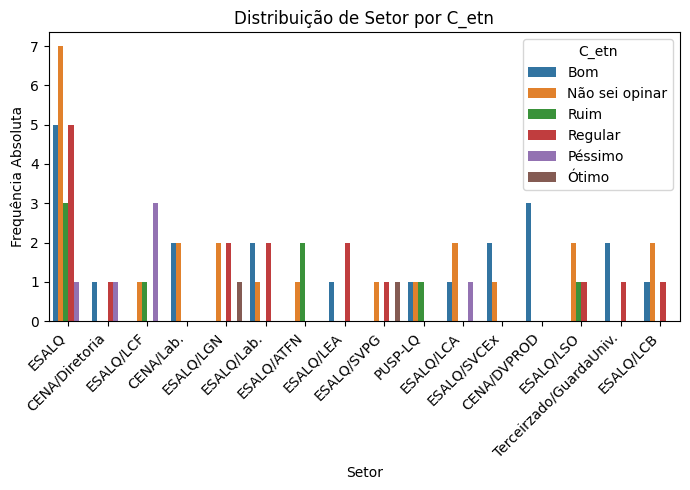

...

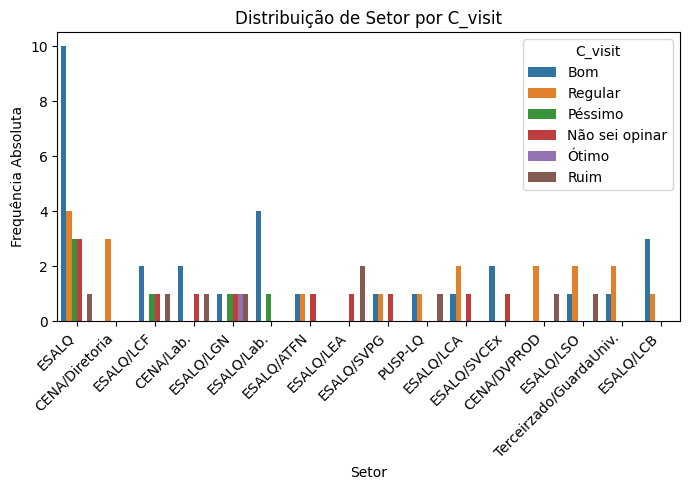

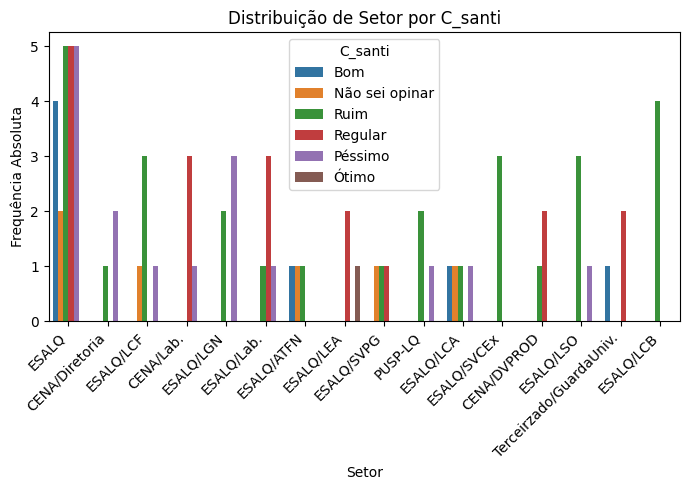

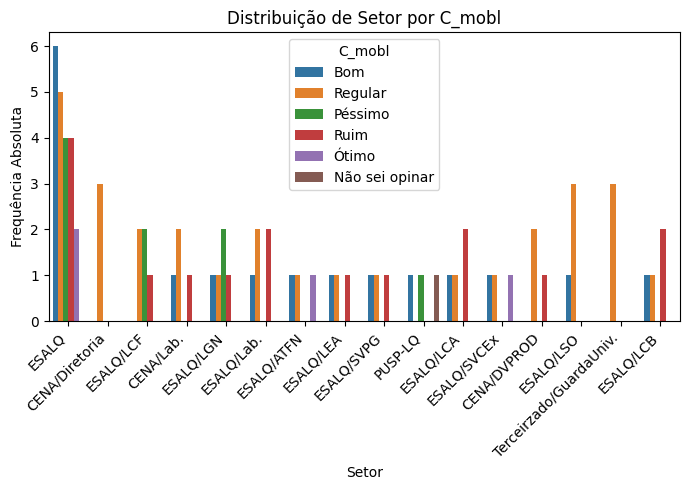

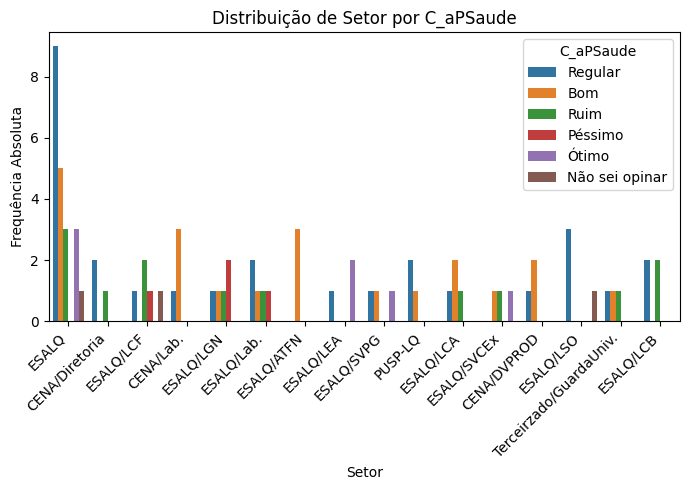

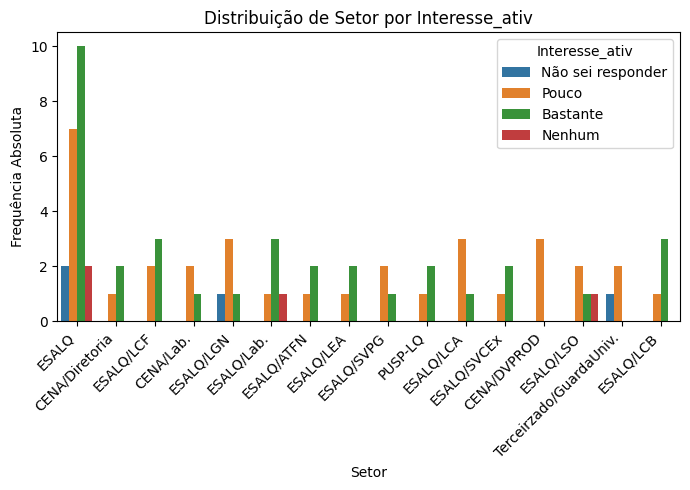

In [151]:
variables_to_plot = [
    'Frequencia', 'Impacto', 'Participação', 'Particip_fora',
    'Interesse', 'Conhecimento', 'Compromisso', 'Transformador', 'Segurança',
    'Alt_seg_noite', 'Modal_atecampus', 'S_Ilum', 'S_ag', 'S_equ', 'S_vias',
    'S_cal', 'S_acess', 'S_sinal', 'S_ciclovias', 'Aplicativo', 'C_Acol',
    'C_pert', 'C_Sau', 'C_atendaluno', 'C_PAPFE', 'C_moradia', 'C_cre', 'C_gen',
    'C_etn', 'C_aces', 'C_Rucas', 'C_alim', 'C_conv', 'C_esp', 'C_estudo',
    'C_int', 'C_infacd', 'C_orgtrans', 'C_qveic', 'C_visit', 'C_santi', 'C_mobl',
    'C_aPSaude', 'Interesse_ativ'
]

for col in variables_to_plot:
    if col in dados_servidor_tecnico_administrativo.columns and 'Setor' in dados_servidor_tecnico_administrativo.columns:
        plt.figure(figsize=(7, 5))
        sns.countplot(data=dados_servidor_tecnico_administrativo, x='Setor', hue=col)
        plt.title(f'Distribuição de Setor por {col}')
        plt.xlabel('Setor')
        plt.ylabel('Frequência Absoluta')
        plt.xticks(rotation=45, ha='right')
        plt.legend(title=col)
        plt.tight_layout()
        plt.show()
    else:
        print(f"One or both columns ('Setor', '{col}') not found in the DataFrame.")